### Climatology difference analysis for the IFS-AMIP twin experiments with and without eddies in the SST forcing
- Inspired by paper Ma et al 2015 on the effect of eddies on weather patterns https://www.nature.com/articles/srep17785
- Analysed here is the DJF climatology between the twin experiments with and w/o eddy forcing in the SSTs in terms of differences in the mean for the following variables:
    - Z500
    - U300
- The significance test uses spicy.stats.wilcoxon https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.wilcoxon.html and xr.apply_ufunc to parallelize these calculations using chunks https://docs.xarray.dev/en/stable/generated/xarray.apply_ufunc.html

Iuliia Polkova polkova@dkrz.de

In [1]:
import xarray as xr
import pandas as pd
import numpy as np
import intake
from dask.diagnostics import ProgressBar

import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cmocean.cm as cmo
import seaborn as sns

import hvplot.xarray
import xskillscore as xs

In [2]:
def ifs_to_latlon(ds):
    '''
    Uses the latitude-longitude information encoded in the regular grid IFS output to reconstructed the regular grid
    '''
    return ds.rename({'value':'latlon'}).set_index(latlon=("lat","lon")).unstack("latlon")
def ifs_fix_time_for_monthly_data(ds):
    '''
    Monthly mean data has the time axis encoded incorrectly.
    This function shifts it back by one day
    '''
    return ds.assign_coords(time=ds['time']- pd.Timedelta('1D'))

## Open and inspect the catalogue

In [3]:
cat = intake.open_catalog('https://raw.githubusercontent.com/eerie-project/intake_catalogues/main/eerie.yaml')\
                          ['dkrz']['disk']['model-output']['ifs-amip']

In [4]:
list(cat)

['amip-hist-obs.atmos.gr025',
 'amip-hist-obs-lr30.atmos.gr025',
 'amip-ng-obs.atmos.gr025',
 'amip-ng-obs-lr30.atmos.gr025']

In [5]:
list(cat['amip-hist-obs.atmos.gr025'])

['2D_const_0.25deg',
 '2D_6h_0.25deg',
 '2D_24h_0.25deg',
 '2D_monthly_0.25deg',
 '3D_6h_0.25deg',
 '3D_24h_0.25deg',
 '3D_monthly_0.25deg']

## Load the data to dask (lazy!)

In [6]:
ds_smooth = cat['amip-hist-obs-lr30.atmos.gr025']['3D_monthly_0.25deg'].to_dask()
ds = cat['amip-hist-obs.atmos.gr025']['3D_monthly_0.25deg'].to_dask()
# The following is necessary for MONTHLY data, NOT step data!
ds_smooth = ifs_fix_time_for_monthly_data(ds_smooth)
ds = ifs_fix_time_for_monthly_data(ds)

In [7]:
ds_smooth = ifs_to_latlon(ds_smooth)
ds = ifs_to_latlon(ds)

In [8]:
ds

<xarray.Dataset>
Dimensions:  (lat: 721, lon: 1440, level: 19, time: 132)
Coordinates:
  * lat      (lat) float64 -90.0 -89.75 -89.5 -89.25 ... 89.25 89.5 89.75 90.0
  * lon      (lon) float64 0.0 0.25 0.5 0.75 1.0 ... 359.0 359.2 359.5 359.8
  * level    (level) int64 1 2 5 10 20 30 50 70 ... 300 400 500 700 850 925 1000
  * time     (time) datetime64[ns] 2010-01-31 2010-02-28 ... 2020-12-31
Data variables:
    d        (time, level, lat, lon) float64 dask.array<chunksize=(1, 1, 721, 1440), meta=np.ndarray>
    q        (time, level, lat, lon) float64 dask.array<chunksize=(1, 1, 721, 1440), meta=np.ndarray>
    t        (time, level, lat, lon) float64 dask.array<chunksize=(1, 1, 721, 1440), meta=np.ndarray>
    u        (time, level, lat, lon) float64 dask.array<chunksize=(1, 1, 721, 1440), meta=np.ndarray>
    v        (time, level, lat, lon) float64 dask.array<chunksize=(1, 1, 721, 1440), meta=np.ndarray>
    vo       (time, level, lat, lon) float64 dask.array<chunksize=(1, 1, 721, 1440), meta=np.ndarray>
    z        (time, level, lat, lon) float64 dask.array<chunksize=(1, 1, 721, 1440), meta=np.ndarray>
Attributes:
    edition:            1
    centre:             ecmf
    centreDescription:  European Centre for Medium-Range Weather Forecasts
    subCentre:          0
    history:            🪄🧙‍♂️🔮 magic dataset assembly provided by gribscan.IF...

### Differences between the AMIP run with (1) prescribed eddies in SSTs and (2) smoothed SSTs.

In [9]:
# difference at each timestep
z500 = ds["z"].sel(level=500)/9.80665
z500_smooth = ds_smooth["z"].sel(level=500)/9.80665

u300 = ds["u"].sel(level=300)
u300_smooth = ds_smooth["u"].sel(level=300)

z500_diff = z500 - z500_smooth
u300_diff = u300 - u300_smooth


In [10]:
ds.u.shape

(132, 19, 721, 1440)

In [11]:
#ds.sst.isel(time=0).plot()
p1=ds.u[0,-1].hvplot.image(cmap="RdBu_r", width=500, height=250, coastline=True, projection=ccrs.PlateCarree())
p1.redim.range(value=(-10, 10))


:Overlay
   .Image.I     :Image   [lon,lat]   (u)
   .Coastline.I :Feature   [Longitude,Latitude]

### Winter season climatology and climatology difference

In [12]:
# Geopotential height
z500_clm=z500.groupby("time.season").mean("time")
z500_smooth_clm=z500_smooth.groupby("time.season").mean("time")
z500_clm_diff = z500_clm - z500_smooth_clm

# U component of wind
u300_clm=u300.groupby("time.season").mean("time")
u300_smooth_clm=u300_smooth.groupby("time.season").mean("time")
u300_clm_diff = u300_clm - u300_smooth_clm


### Wilcoxon significance test for the climatology differences

In [13]:
def month_selector(month):
    return (month >= 1) & (month <= 2) | (month >=12) # select Jan, Feb, Dec

def djf_average(x_djf):
    x_djf = x_djf.rolling(time = 3).mean() # rolling mean over three months: JFD, FDJ, DJF, ...
    x_djf = x_djf[x_djf.time.dt.month == 12] # pick rolling mean that starts with Dec
    return x_djf


In [14]:
# Geopotential height
z500_djf = z500.sel(time=month_selector(ds["z"]['time.month']))
z500_djf = djf_average(z500_djf)

z500_smooth_djf = z500_smooth.sel(time=month_selector(ds_smooth["z"]['time.month']))
z500_smooth_djf = djf_average(z500_smooth_djf)

# U component of wind
u300_djf = u300.sel(time=month_selector(ds["u"]['time.month']))
u300_djf = djf_average(u300_djf)

u300_smooth_djf = u300_smooth.sel(time=month_selector(ds_smooth["u"]['time.month']))
u300_smooth_djf = djf_average(u300_smooth_djf)


In [15]:
import scipy.stats as stats

def wilcoxon_gufunc(x,y):
    s,p = stats.wilcoxon(x, y) 
    return p

In [16]:
def wilcoxon_xr(x, y, dim):
    return xr.apply_ufunc(
        wilcoxon_gufunc, # first the function
        x,  # now arguments in the order expected by the function
        y,
        #input_core_dims=[["time"],["time"]],  # list with one entry per arg
        input_core_dims=[[dim],[dim]],  # list with one entry per arg
        output_core_dims=[[]],
        #exclude_dims=set(("lat",)),
        dask="parallelized",
        output_dtypes=[float],
		#dask_gufunc_kwargs={'allow_rechunk': True},
        vectorize=True,  # loop over non-core dims
	)


In [17]:
z500_wt = wilcoxon_xr(z500_djf.chunk({"time": -1, "lon":100, "lat":100}), z500_smooth_djf.chunk({"time": -1, "lon":100, "lat":100}),dim="time").compute()
u300_wt = wilcoxon_xr(u300_djf.chunk({"time": -1, "lon":100, "lat":100}), u300_smooth_djf.chunk({"time": -1, "lon":100, "lat":100}),dim="time").compute()


In [18]:
#z500_wt.hvplot.image(cmap="RdBu_r", width=1000, height=500, coastline=True)

In [19]:
# H0: means are the same
# for p-value smaller 0.05 (0.1) H0 can be rejected, thus means between the experiments are not the same
z500_clmdiff_mask=z500_clm_diff[0].where(z500_wt < 0.1)
u300_clmdiff_mask=u300_clm_diff[0].where(u300_wt < 0.1)


### Plot clm differences 

/sw/spack-levante/mambaforge-22.9.0-2-Linux-x86_64-kptncg/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:1714: UserWarning: The following kwargs were not used by contour: 'linewidth'
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)


Text(0.5, 1.0, 'U300 DJF diff')

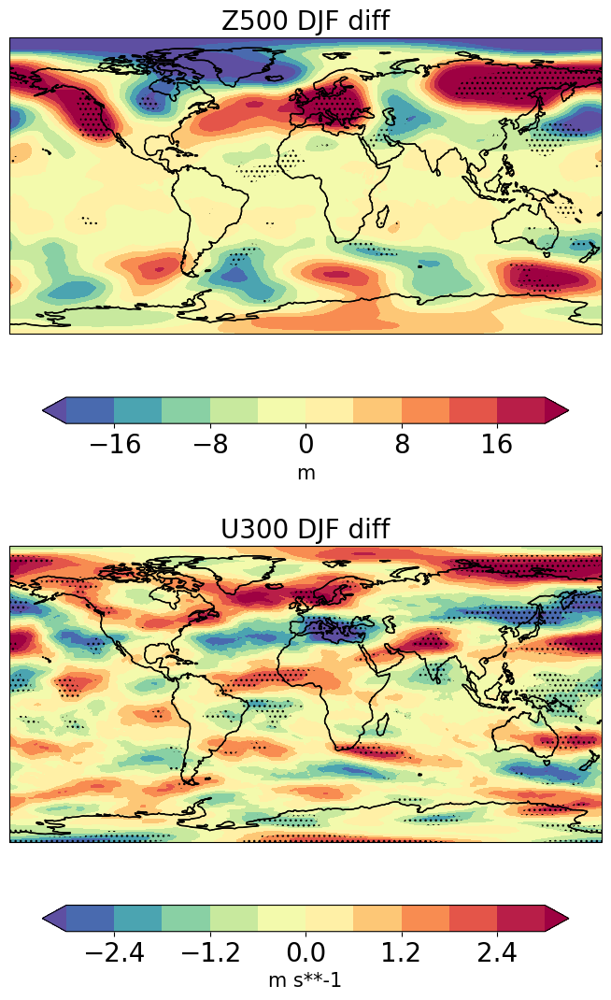

In [20]:
fig=plt.figure(figsize=(20,20))
proj=ccrs.PlateCarree()

z500_levels = np.linspace(-20, 20, 11)
u300_levels = np.linspace(-3, 3, 11)

ax1 = plt.subplot(321, projection=proj)
ax1.coastlines(resolution='110m')
p = ax1.contourf(ds.lon, ds.lat, z500_clm_diff[0],
               #ds.lon.sel(lon=slice(0,60)), ds.lat.sel(lat=slice(40,60)), z500_clm_diff[0].sel(lat=slice(40,60),lon=slice(0,60)),
               vmin=-20,vmax=20,levels=z500_levels,
               extend='both',
               cmap = plt.get_cmap('Spectral_r'),
               transform=ccrs.PlateCarree())
pp=ax1.contourf(ds.lon, ds.lat, z500_clmdiff_mask, colors='none', #alpha=0.5,
               #vmin=-1,vmax=1,levels=levels,
               hatches=['...','...'],linewidth=15,
               #transform=ccrs.PlateCarree()
               )
cbar = plt.colorbar(p, orientation='horizontal', shrink=0.8)
cbar.set_label('m',fontsize=15)
#cbar.set_clim(0,5)
cbar.ax.tick_params(labelsize=20)
ax1.coastlines()
ax1.set_title('Z500 DJF diff',fontsize=20)
#ax1.set_global()

ax2 = plt.subplot(323, projection=proj)
ax2.coastlines(resolution='110m')
p = ax2.contourf(ds.lon, ds.lat, u300_clm_diff[0],
               vmin=-3,vmax=3,levels=u300_levels,
               extend='both',
               cmap = plt.get_cmap('Spectral_r'),
               transform=ccrs.PlateCarree())
pp=ax2.contourf(ds.lon, ds.lat, u300_clmdiff_mask, colors='none',
               #vmin=-1,vmax=1,levels=t2m_levels,
               hatches=['...','...'],linewidth=15,
               #transform=ccrs.PlateCarree()
               )
cbar = plt.colorbar(p, orientation='horizontal', shrink=0.8)
cbar.set_label('m s**-1',fontsize=15)
#cbar.set_clim(0,5)
cbar.ax.tick_params(labelsize=20)
ax2.coastlines()
ax2.set_title('U300 DJF diff',fontsize=20)
#ax1.set_global()


#ax1.set_global()
#plt.savefig('....png', bbox_inches='tight', dpi=300)

### Effect of prescribed eddy-rich SST-forcing on the winter mean state in the North Atlantic
#### Z500

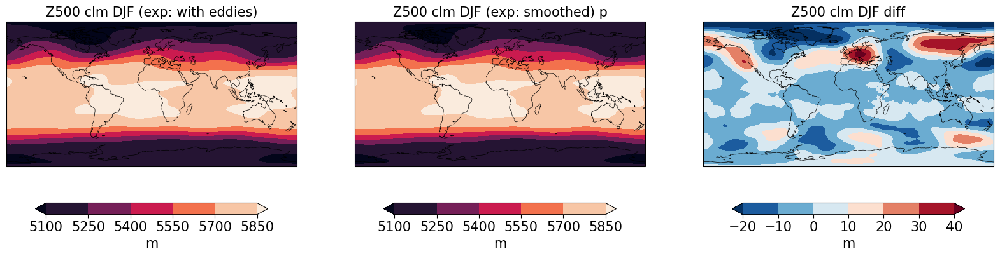

In [21]:
f=plt.figure(figsize=(20,5))

proj=ccrs.PlateCarree()
levels = np.linspace(-10, 10, 11)
#levels_contour = np.linspace(-20, 20, 6)

ax1 = plt.subplot(131,projection=proj)
ax1.coastlines(resolution='110m', linewidth=0.5)
p = ax1.contourf(ds.lon,ds.lat,z500_clm[0],
                   #vmin=-20,vmax=20,levels=levels,
                   extend='both',
                   cmap = plt.get_cmap('rocket'))
cbar = plt.colorbar(p, orientation='horizontal', shrink=0.8)
cbar.set_label('m',fontsize=15)
ax1.set_title('Z500 clm DJF (exp: with eddies)',fontsize=15)
ax1.set_xlabel('lon',fontsize=15)
ax1.set_ylabel('lat',fontsize=15)
#ax1.set_ylim(ax1.get_ylim()[::-1])
ax1.xaxis.set_tick_params(labelsize=15)
ax1.yaxis.set_tick_params(labelsize=15)
cbar.ax.tick_params(labelsize=15)

ax2 = plt.subplot(132,projection=proj)
ax2.coastlines(resolution='110m', linewidth=0.5)
p = ax2.contourf(ds.lon,ds.lat,z500_smooth_clm[0],
                   #vmin=-20,vmax=20,levels=levels,
                   extend='both',
                   cmap = plt.get_cmap('rocket'))
cbar = plt.colorbar(p, orientation='horizontal', shrink=0.8)
cbar.set_label('m',fontsize=15)
ax2.set_title('Z500 clm DJF (exp: smoothed) p',fontsize=15)
ax2.set_xlabel('lon',fontsize=15)
ax2.set_ylabel('lat',fontsize=15)
#ax2.set_ylim(ax2.get_ylim()[::-1])
ax2.xaxis.set_tick_params(labelsize=15)
ax2.yaxis.set_tick_params(labelsize=15)
cbar.ax.tick_params(labelsize=15)

ax3 = plt.subplot(133,projection=proj)
ax3.coastlines(resolution='110m', linewidth=0.5)
p = ax3.contourf(ds.lon,ds.lat,z500_clm_diff[0],
                   #vmin=-10,vmax=10,levels=levels,
                   extend='both',
                   cmap = plt.get_cmap('RdBu_r'))
cbar = plt.colorbar(p, orientation='horizontal', shrink=0.8)
cbar.set_label('m',fontsize=15)
ax3.set_title('Z500 clm DJF diff',fontsize=15)
ax3.set_xlabel('lon',fontsize=15)
ax3.set_ylabel('lat',fontsize=15)
#ax2.set_ylim(ax2.get_ylim()[::-1])
ax3.xaxis.set_tick_params(labelsize=15)
ax3.yaxis.set_tick_params(labelsize=15)
cbar.ax.tick_params(labelsize=15)

### Effect of prescribed eddy-rich SST-forcing on the winter mean state in the North Atlantic
#### 300hPa zonal wind
#### meso-scale SST forcing might affect the position of the mean wind.

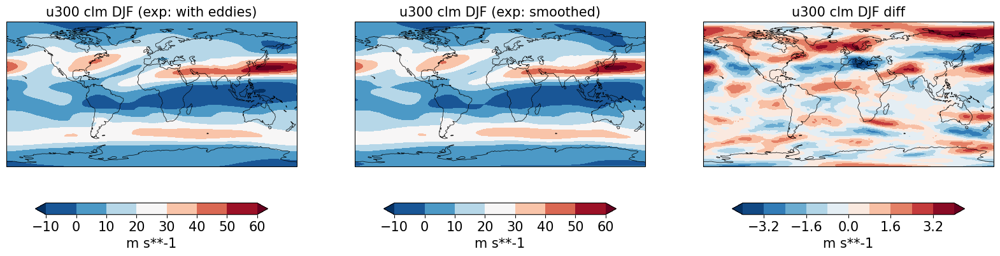

In [22]:
f=plt.figure(figsize=(20,5))

proj=ccrs.PlateCarree()
levels = np.linspace(-4, 4, 11)
#levels_contour = np.linspace(-20, 20, 6)

ax1 = plt.subplot(131,projection=proj)
ax1.coastlines(resolution='110m', linewidth=0.5)
p = ax1.contourf(ds.lon,ds.lat,u300_clm[0],
                   #vmin=-10,vmax=10,levels=levels,
                   extend='both',
                   cmap = plt.get_cmap('RdBu_r'))
cbar = plt.colorbar(p, orientation='horizontal', shrink=0.8)
cbar.set_label('m s**-1',fontsize=15)
ax1.set_title('u300 clm DJF (exp: with eddies)',fontsize=15)
ax1.set_xlabel('lon',fontsize=15)
ax1.set_ylabel('lat',fontsize=15)
#ax1.set_ylim(ax1.get_ylim()[::-1])
ax1.xaxis.set_tick_params(labelsize=15)
ax1.yaxis.set_tick_params(labelsize=15)
cbar.ax.tick_params(labelsize=15)

ax2 = plt.subplot(132, projection=proj)
ax2.coastlines(resolution='110m', linewidth=0.5)
p = ax2.contourf(ds.lon,ds.lat,u300_smooth_clm[0],
                   #vmin=-10,vmax=10,levels=levels,
                   extend='both',
                   cmap = plt.get_cmap('RdBu_r'))
cbar = plt.colorbar(p, orientation='horizontal', shrink=0.8)
cbar.set_label('m s**-1',fontsize=15)
ax2.set_title('u300 clm DJF (exp: smoothed)',fontsize=15)
ax2.set_xlabel('lon',fontsize=15)
ax2.set_ylabel('lat',fontsize=15)
#ax2.set_ylim(ax2.get_ylim()[::-1])
ax2.xaxis.set_tick_params(labelsize=15)
ax2.yaxis.set_tick_params(labelsize=15)
cbar.ax.tick_params(labelsize=15)

ax3 = plt.subplot(133, projection=proj)
ax3.coastlines(resolution='110m', linewidth=0.5)
p = ax3.contourf(ds.lon,ds.lat,u300_clm_diff[0],
                   vmin=-4,vmax=4,levels=levels,
                   extend='both',
                   cmap = plt.get_cmap('RdBu_r'),
                transform=ccrs.PlateCarree())
cbar = plt.colorbar(p, orientation='horizontal', shrink=0.8)
cbar.set_label('m s**-1',fontsize=15)
ax3.set_title('u300 clm DJF diff',fontsize=15)
ax3.set_xlabel('lon',fontsize=15)
ax3.set_ylabel('lat',fontsize=15)
#ax2.set_ylim(ax2.get_ylim()[::-1])
ax3.xaxis.set_tick_params(labelsize=15)
ax3.yaxis.set_tick_params(labelsize=15)
cbar.ax.tick_params(labelsize=15)